## Breast Cancer Wisconsin (Diagnostic) Data analysis

### Libraries and resources

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, accuracy_score, ConfusionMatrixDisplay
from sklearn.preprocessing import StandardScaler
import seaborn as sns
sns.set()
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import classification_report

### Importing the data set

In [2]:
df = pd.read_csv('breast_cancer_wisconsin.csv')

### General overview of the date set

Breast Cancer Wisconsin (Diagnostic) Data Set: Features are computed from a digitized image of a fine needle aspirate (FNA) of a breast mass. They describe characteristics of the cell nuclei present in the image. The description and the source of the data set may be found in https://www.kaggle.com/datasets/uciml/breast-cancer-wisconsin-data 

In [3]:
df.head(10)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN
5,843786,M,12.45,15.70,82.57,477.1,0.12780,0.17000,0.15780,0.08089,...,23.75,103.40,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.12440,NaN
6,844359,M,18.25,19.98,119.60,1040.0,0.09463,0.10900,0.11270,0.07400,...,27.66,153.20,1606.0,0.1442,0.2576,0.3784,0.1932,0.3063,0.08368,NaN
7,84458202,M,13.71,20.83,90.20,577.9,0.11890,0.16450,0.09366,0.05985,...,28.14,110.60,897.0,0.1654,0.3682,0.2678,0.1556,0.3196,0.11510,NaN
8,844981,M,13.00,21.82,87.50,519.8,0.12730,0.19320,0.18590,0.09353,...,30.73,106.20,739.3,0.1703,0.5401,0.5390,0.2060,0.4378,0.10720,NaN
9,84501001,M,12.46,24.04,83.97,475.9,0.11860,0.23960,0.22730,0.08543,...,40.68,97.65,711.4,0.1853,1.0580,1.1050,0.2210,0.4366,0.20750,NaN


In [4]:
df['diagnosis'].unique()

array(['M', 'B'], dtype=object)

In [5]:
df.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,0.0
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,NaN
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,NaN
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,NaN
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,NaN
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,NaN
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,NaN
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,NaN


In [6]:
df.isnull().sum()

id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed:

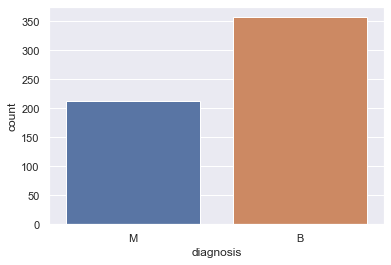

In [7]:
sns.countplot(x='diagnosis', data=df)
plt.xticks()
plt.show()

There are 32 variables, which 30 of them are numeric and corresponds to different meassures of the cell nuclei of each image, one categorical that indicate if the breast mass is malign or benign and the id to identify each record in the dataset.

### Dataset handling and transformation

The main objective of this project is to train and test a classification machine learning model using the Breast Cancer Dataset. In this case, we will use the Logistic Regression Model from scikit-learn to predict whether a breast mass is malignant or benign.

Before starting the model training, one crucial consideration is that the objective variable (diagnosis) is not balanced. There are more records of benign breast masses than malignant ones. To ensure the proper training of the model, a random sample will be taken from the dataset with the aim of balancing the number of records for this variable.   

In [8]:
from imblearn.under_sampling import RandomUnderSampler
undersample = RandomUnderSampler(random_state=42)

The columns 'id' and 'unnamed' are unnecessary for this project. Therefore, both of these variables will be deleted from the dataset.

In [9]:
X = df.drop(['diagnosis','Unnamed: 32','id'],axis=1)
y = df.diagnosis

In [10]:
X_over , y_over = undersample.fit_resample(X,y)

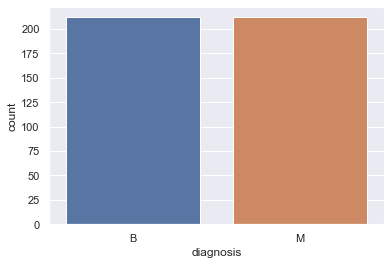

In [11]:
sns.countplot(x=y_over, data=df)
plt.xticks()
plt.show()

In [12]:
df.shape

(569, 33)

In [13]:
X_over.shape

(424, 30)

After the balancing process, there are 424 records, indicating that 145 records were deleted. Consequently, there was a loss of 25% of the records compared to the original set.

The next step will involve transforming the objective variable (diagnosis) into a numeric variable to ensure compatibility with the Logistic Regression Model.

In [14]:
y_over.replace(list(np.unique(y_over)), [1,2], inplace=True)

In [15]:
list(np.unique(y_over))

[1, 2]

To assess the relevance of each variable and determine its impact on the prediction of the "diagnosis", a measure of correlation will be calculated across the entire dataset. This will help to avoid over-fitting the model results.

In [16]:
df_data_processing = X_over
df_data_processing['diagnosis'] = y_over

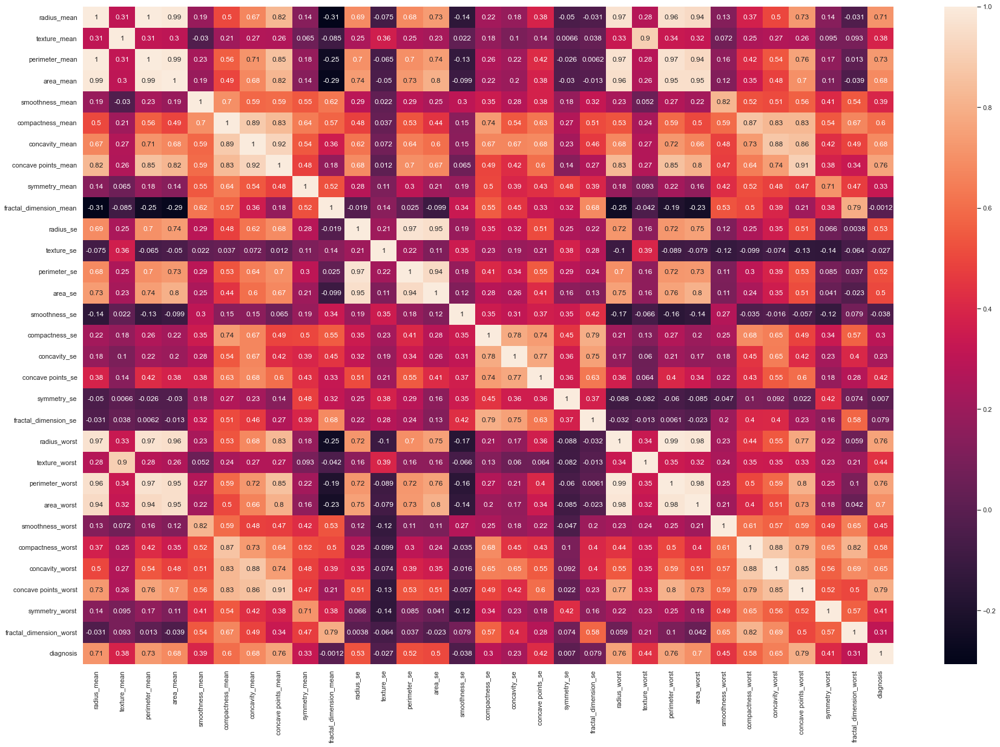

In [17]:
plt.figure(figsize=(30,20))
sns.heatmap(df_data_processing.corr(), annot=True)
plt.show()

The above chart reveals a high correlation among certain variables ('perimeter_mean,' 'area_mean,' 'perimeter_worst,' 'area_worst,' 'radius_worst,' 'perimeter_se,' 'area_se'). None of these will be included in the model training dataset.

After all, one transformation remains before starting the model training, and that is standardizing the scale of each numerical variable while preserving the original distribution. This ensures that the algorithm of the model can properly process the dataset.

In [18]:
scaler = MinMaxScaler()
df_data_processing_scaled =  scaler.fit_transform(df_data_processing)
df_data_processing_scaled = pd.DataFrame(df_data_processing_scaled)
df_data_processing_scaled.columns = df_data_processing.columns
df_data_processing_scaled.head(5)

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,diagnosis
0,0.311915,0.252621,0.297253,0.188235,0.177817,0.104994,0.062816,0.161581,0.293434,0.161752,...,0.355011,0.213156,0.114356,0.233969,0.092955,0.067572,0.271856,0.188843,0.072478,0.0
1,0.102160,0.246195,0.103330,0.051403,0.408266,0.198331,0.101546,0.088370,0.264646,0.435762,...,0.251866,0.087388,0.035580,0.498778,0.144764,0.103834,0.183299,0.190814,0.194412,0.0
2,0.304080,0.322286,0.289994,0.185575,0.172465,0.103920,0.070173,0.102883,0.262121,0.125948,...,0.383795,0.253724,0.150581,0.232649,0.110807,0.133626,0.280069,0.155924,0.137675,0.0
3,0.233557,0.105512,0.219542,0.131683,0.111111,0.064567,0.016806,0.057107,0.279293,0.214195,...,0.115672,0.146154,0.077015,0.153338,0.036363,0.013371,0.092096,0.140942,0.099961,0.0
4,0.196826,0.235374,0.190293,0.108642,0.422143,0.127508,0.084161,0.129225,0.140909,0.199874,...,0.358742,0.160998,0.080166,0.369346,0.073260,0.083546,0.239450,0.028977,0.120622,0.0


Taking advantage of the transformation below, a pair plot will illustrate the relationship of each independent variable with the objective variable ('diagnosis')

<Figure size 720x720 with 0 Axes>

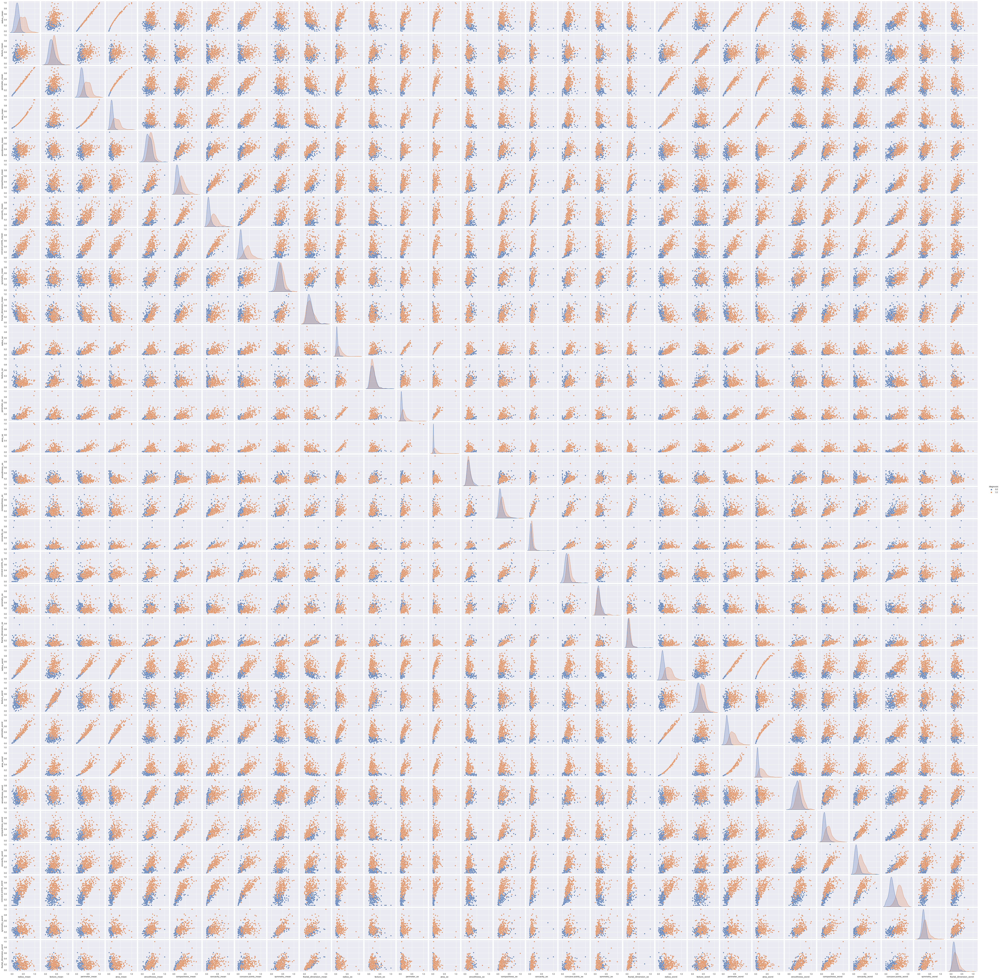

In [19]:
fig = plt.figure(figsize=(10,10))
sns.pairplot(data= df_data_processing_scaled, hue='diagnosis')
plt.show()

Based on the graph above, clusters of records can be observed, highlighting differences between the outcomes of benign and malignant breast masses. 

### Logistic regression model

The dataset will be split, with 80% of the records allocated for training the model and the remaining 20% for testing the model.

In [20]:
X = df_data_processing_scaled.drop(['diagnosis','perimeter_mean', 'area_mean','perimeter_worst','area_worst','radius_worst','perimeter_se','area_se'],axis=1)
y = df_data_processing_scaled['diagnosis'].values

In [21]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=42)

In [22]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()
result = model.fit(X_train, y_train)

In [23]:
from sklearn import metrics
prediction_test = model.predict(X_test)
print(metrics.accuracy_score(y_test,prediction_test))

0.9764705882352941


After parameterization and running the respective model, it achieved a prediction accuracy of 97%.

<Figure size 792x792 with 0 Axes>

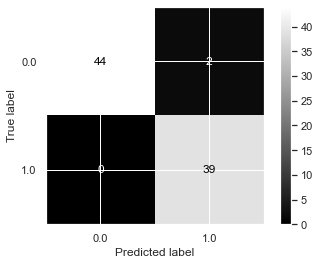

In [24]:
fig = plt.figure(figsize=(11,11))
cm = confusion_matrix(y_test, prediction_test, labels=model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels=model.classes_)
disp.plot(cmap='gray')
plt.show()

The confusion matrix confirms the accuracy score obtained previously, with only two records misclassified in the wrong section.

In [25]:
report = classification_report(y_test,prediction_test, labels = [0,1])
print(report)

              precision    recall  f1-score   support

           0       1.00      0.96      0.98        46
           1       0.95      1.00      0.97        39

    accuracy                           0.98        85
   macro avg       0.98      0.98      0.98        85
weighted avg       0.98      0.98      0.98        85



The precision of the model is very high, and the optimization of performance metrics will be minimal. However, one thing to consider is the significance of each independent variable in predicting the diagnosis class. Therefore, the next step involves selecting the variables that have a more significant impact within the Logistic Regression Model.

AxesSubplot(0.125,0.125;0.775x0.755)


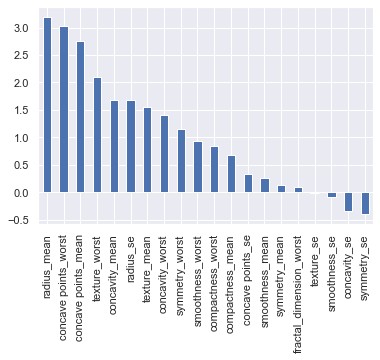

In [26]:
weights = pd.Series(model.coef_[0],
                    index=X.columns.values)
print(weights.sort_values(ascending=False)[:20].plot(kind='bar'))

AxesSubplot(0.125,0.125;0.775x0.755)


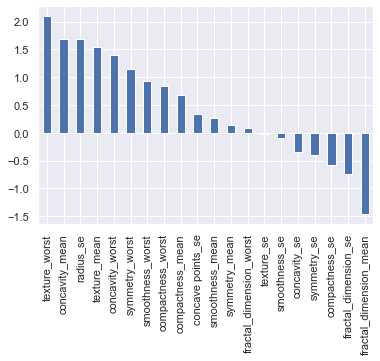

In [27]:
weights = pd.Series(model.coef_[0],
                    index=X.columns.values)
print(weights.sort_values(ascending=False)[-20:].plot(kind='bar'))

In [28]:
filtered_features = (weights.values < -0.5) | (weights.values > 1)
weights = weights[filtered_features]

AxesSubplot(0.125,0.125;0.775x0.755)


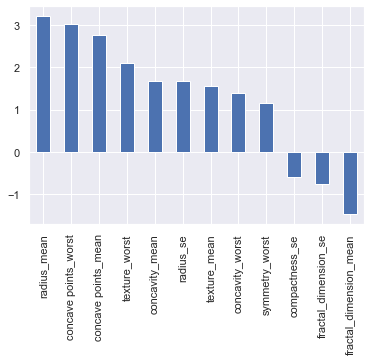

In [29]:
print(weights.sort_values(ascending=False)[-20:].plot(kind='bar'))

In [30]:
new_features = weights.index
X = df_data_processing_scaled[new_features].values
y = df_data_processing_scaled['diagnosis'].values

In [31]:
print(new_features)

Index(['radius_mean', 'texture_mean', 'concavity_mean', 'concave points_mean',
       'fractal_dimension_mean', 'radius_se', 'compactness_se',
       'fractal_dimension_se', 'texture_worst', 'concavity_worst',
       'concave points_worst', 'symmetry_worst'],
      dtype='object')


In order to achieve a less complex model while maintaining high performance results, the final variable selection includes only 12 variables from the original set. The model will be ejecuted with the same parameters. 

In [32]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=42)

In [33]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()
result = model.fit(X_train, y_train)

In [34]:
from sklearn import metrics
prediction_test = model.predict(X_test)
print(metrics.accuracy_score(y_test,prediction_test))

0.9647058823529412


<Figure size 792x792 with 0 Axes>

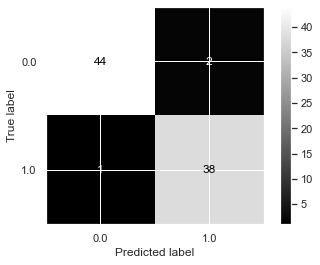

In [35]:
fig = plt.figure(figsize=(11,11))
cm = confusion_matrix(y_test, prediction_test, labels=model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels=model.classes_)
disp.plot(cmap='gray')
plt.show()

In [36]:
report = classification_report(y_test,prediction_test, labels = [0,1])
print(report)

              precision    recall  f1-score   support

           0       0.98      0.96      0.97        46
           1       0.95      0.97      0.96        39

    accuracy                           0.96        85
   macro avg       0.96      0.97      0.96        85
weighted avg       0.97      0.96      0.96        85



In conclusion, the final model is slightly less precise than the initially obtained, by just 1%. However, this difference is not statistically significant. Therefore, the ultimate decision depends on whether the goal is to achieve the utmost accuracy or to reduce the complexity of the model for better performance in a big data environment.